### Hamed Ajorlou 97101167

phase 1

Dataset prepration

In [ ]:
import numpy as np 
import pandas as pd 
import cv2
import os
from google.colab.patches import cv2_imshow

Dataset = []
address = '/content/drive/MyDrive/MLV_Project_Images/'
for pic in os.listdir(address) : 
    Dataset.append(cv2.cvtColor(cv2.imread(address + pic), cv2.COLOR_BGR2RGB))

ref_1 = cv2.cvtColor(cv2.imread('/content/drive/MyDrive/ref/ref_1.jpeg'), cv2.COLOR_BGR2RGB)
ref_2 = cv2.cvtColor(cv2.imread('/content/drive/MyDrive/ref/ref_2.jpeg'), cv2.COLOR_BGR2RGB)
ref_3 = cv2.cvtColor(cv2.imread('/content/drive/MyDrive/ref/ref_3.jpg'), cv2.COLOR_BGR2RGB)
ref_4 = cv2.cvtColor(cv2.imread('/content/drive/MyDrive/ref/ref_4.jpg'), cv2.COLOR_BGR2RGB)

colorindx = np.zeros((len(Dataset) ,3))
for i in range(len(Dataset)):
    colorindx[i,:] = np.mean(Dataset[i] , axis=0).mean(axis = 0 )

In [ ]:
pics = []
for pic in Dataset :
  pics.append(cv2.resize(pic,(200,200))) 

pics=np.array(pics)

In [ ]:
ref_1.shape[0]

650

In [ ]:
len(Dataset)

1335

In [ ]:
import math

making conformity function and matrix based on RMSE and cosine criterion

In [ ]:
x0 = 30
x1 = 30
p0 = int(ref_4.shape[0] / x0)
p1 = int(ref_4.shape[1] / x1)
piecewise = []
for i in range(x0):
    for j in range(x1):
        piecewise.append(ref_4[p0*i:p0*(i+1), p1*j:p1*(j+1)])

def conformity(V,U,sample_size,criterion):
    if criterion == 'cosine' :
        cosine = np.dot(V.reshape((1,3)) ,U.reshape((3,1))) / (np.linalg.norm(V)*np.linalg.norm(U))
        return(cosine)
    elif criterion == 'rmse':
        MSE = np.square(np.subtract(U,V)).mean() 
        RMSE = math.sqrt(MSE)
        return(RMSE)
    else :
        print('Not Determined!')

for i in  range(x0):
    for j in range(x1):
        v_pics = [] 
        for k in range(len(colorindx)):
            v_pics.append(conformity(colorindx[k,...] ,np.mean(piecewise[x0*i+j] , axis=0).mean(axis= 0) , sample_size =  len(Dataset),criterion='cosine'))
        if j == 0:
            f1 = pics[np.argmax(v_pics)]
            f2 = f1
        else : 
            f1 = pics[np.argmax(v_pics)]
            f1 = np.concatenate((f2,f1) , axis = 1 )
            f2 = f1
    if i == 0:
        photo_1 = f1
        photo_2 = photo_1
    else : 
        photo_1 = f1
        photo_1 = np.concatenate((photo_2,photo_1), axis=0)
        photo_2 = photo_1

ref4_30_cosine = photo_1

In [ ]:
x0 = 40
x1 = 40
p0 = int(ref_4.shape[0] / x0)
p1 = int(ref_4.shape[1] / x1)
piecewise = []
for i in range(x0):
    for j in range(x1):
        piecewise.append(ref_4[p0*i:p0*(i+1), p1*j:p1*(j+1)])

def conformity(V,U,sample_size,criterion):
    if criterion == 'cosine' :
        cosine = np.dot(V.reshape((1,3)) ,U.reshape((3,1))) / (np.linalg.norm(V)*np.linalg.norm(U))
        return(cosine)
    elif criterion == 'rmse':
        MSE = np.square(np.subtract(U,V)).mean() 
        RMSE = math.sqrt(MSE)
        return(RMSE)
    else :
        print('Not Determined!')

for i in  range(x0):
    for j in range(x1):
        v_pics = [] 
        for k in range(len(colorindx)):
            v_pics.append(conformity(colorindx[k,...] ,np.mean(piecewise[x0*i+j] , axis=0).mean(axis= 0) , sample_size =  len(Dataset),criterion='cosine'))
        if j == 0:
            f1 = pics[np.argmax(v_pics)]
            f2 = f1
        else : 
            f1 = pics[np.argmax(v_pics)]
            f1 = np.concatenate((f2,f1) , axis = 1 )
            f2 = f1
    if i == 0:
        photo_1 = f1
        photo_2 = photo_1
    else : 
        photo_1 = f1
        photo_1 = np.concatenate((photo_2,photo_1), axis=0)
        photo_2 = photo_1

ref4_40_cosine = photo_1

iterating for different sizes

In [ ]:
x0 = 50
x1 = 50
p0 = int(ref_4.shape[0] / x0)
p1 = int(ref_4.shape[1] / x1)
piecewise = []
for i in range(x0):
    for j in range(x1):
        piecewise.append(ref_4[p0*i:p0*(i+1), p1*j:p1*(j+1)])

def conformity(V,U,sample_size,criterion):
    if criterion == 'cosine' :
        cosine = np.dot(V.reshape((1,3)) ,U.reshape((3,1))) / (np.linalg.norm(V)*np.linalg.norm(U))
        return(cosine)
    elif criterion == 'rmse':
        MSE = np.square(np.subtract(U,V)).mean() 
        RMSE = math.sqrt(MSE)
        return(RMSE)
    else :
        print('Not Determined!')

for i in  range(x0):
    for j in range(x1):
        v_pics = [] 
        for k in range(len(colorindx)):
            v_pics.append(conformity(colorindx[k,...] ,np.mean(piecewise[x0*i+j] , axis=0).mean(axis= 0) , sample_size =  len(Dataset),criterion='cosine'))
        if j == 0:
            f1 = pics[np.argmax(v_pics)]
            f2 = f1
        else : 
            f1 = pics[np.argmax(v_pics)]
            f1 = np.concatenate((f2,f1) , axis = 1 )
            f2 = f1
    if i == 0:
        photo_1 = f1
        photo_2 = photo_1
    else : 
        photo_1 = f1
        photo_1 = np.concatenate((photo_2,photo_1), axis=0)
        photo_2 = photo_1

ref4_50_cosine = photo_1

In [ ]:
x0 = 30
x1 = 30
p0 = int(ref_4.shape[0] / x0)
p1 = int(ref_4.shape[1] / x1)
piecewise = []
for i in range(x0):
    for j in range(x1):
        piecewise.append(ref_4[p0*i:p0*(i+1), p1*j:p1*(j+1)])

def conformity(V,U,sample_size,criterion):
    if criterion == 'cosine' :
        cosine = np.dot(V.reshape((1,3)) ,U.reshape((3,1))) / (np.linalg.norm(V)*np.linalg.norm(U))
        return(cosine)
    elif criterion == 'rmse':
        MSE = np.square(np.subtract(U,V)).mean() 
        RMSE = math.sqrt(MSE)
        return(RMSE)
    else :
        print('Not Determined!')

for i in  range(x0):
    for j in range(x1):
        v_pics = [] 
        for k in range(len(colorindx)):
            v_pics.append(conformity(colorindx[k,...] ,np.mean(piecewise[x0*i+j] , axis=0).mean(axis= 0) , sample_size =  len(Dataset),criterion='rmse'))
        if j == 0:
            f1 = pics[np.argmin(v_pics)]
            f2 = f1
        else : 
            f1 = pics[np.argmin(v_pics)]
            f1 = np.concatenate((f2,f1) , axis = 1 )
            f2 = f1
    if i == 0:
        photo_1 = f1
        photo_2 = photo_1
    else : 
        photo_1 = f1
        photo_1 = np.concatenate((photo_2,photo_1), axis=0)
        photo_2 = photo_1

ref4_30_rmse = photo_1

In [ ]:
x0 = 40
x1 = 40
p0 = int(ref_4.shape[0] / x0)
p1 = int(ref_4.shape[1] / x1)
piecewise = []
for i in range(x0):
    for j in range(x1):
        piecewise.append(ref_4[p0*i:p0*(i+1), p1*j:p1*(j+1)])

def conformity(V,U,sample_size,criterion):
    if criterion == 'cosine' :
        cosine = np.dot(V.reshape((1,3)) ,U.reshape((3,1))) / (np.linalg.norm(V)*np.linalg.norm(U))
        return(cosine)
    elif criterion == 'rmse':
        MSE = np.square(np.subtract(U,V)).mean() 
        RMSE = math.sqrt(MSE)
        return(RMSE)
    else :
        print('Not Determined!')

for i in  range(x0):
    for j in range(x1):
        v_pics = [] 
        for k in range(len(colorindx)):
            v_pics.append(conformity(colorindx[k,...] ,np.mean(piecewise[x0*i+j] , axis=0).mean(axis= 0) , sample_size =  len(Dataset),criterion='rmse'))
        if j == 0:
            f1 = pics[np.argmin(v_pics)]
            f2 = f1
        else : 
            f1 = pics[np.argmin(v_pics)]
            f1 = np.concatenate((f2,f1) , axis = 1 )
            f2 = f1
    if i == 0:
        photo_1 = f1
        photo_2 = photo_1
    else : 
        photo_1 = f1
        photo_1 = np.concatenate((photo_2,photo_1), axis=0)
        photo_2 = photo_1

ref4_40_rmse = photo_1

In [ ]:
x0 = 50
x1 = 50
p0 = int(ref_4.shape[0] / x0)
p1 = int(ref_4.shape[1] / x1)
piecewise = []
for i in range(x0):
    for j in range(x1):
        piecewise.append(ref_4[p0*i:p0*(i+1), p1*j:p1*(j+1)])

def conformity(V,U,sample_size,criterion):
    if criterion == 'cosine' :
        cosine = np.dot(V.reshape((1,3)) ,U.reshape((3,1))) / (np.linalg.norm(V)*np.linalg.norm(U))
        return(cosine)
    elif criterion == 'rmse':
        MSE = np.square(np.subtract(U,V)).mean() 
        RMSE = math.sqrt(MSE)
        return(RMSE)
    else :
        print('Not Determined!')

for i in  range(x0):
    for j in range(x1):
        v_pics = [] 
        for k in range(len(colorindx)):
            v_pics.append(conformity(colorindx[k,...] ,np.mean(piecewise[x0*i+j] , axis=0).mean(axis= 0) , sample_size =  len(Dataset),criterion='rmse'))
        if j == 0:
            f1 = pics[np.argmin(v_pics)]
            f2 = f1
        else : 
            f1 = pics[np.argmin(v_pics)]
            f1 = np.concatenate((f2,f1) , axis = 1 )
            f2 = f1
    if i == 0:
        photo_1 = f1
        photo_2 = photo_1
    else : 
        photo_1 = f1
        photo_1 = np.concatenate((photo_2,photo_1), axis=0)
        photo_2 = photo_1

ref4_50_rmse = photo_1

Text(0.5, 1.0, 'rmse_50')

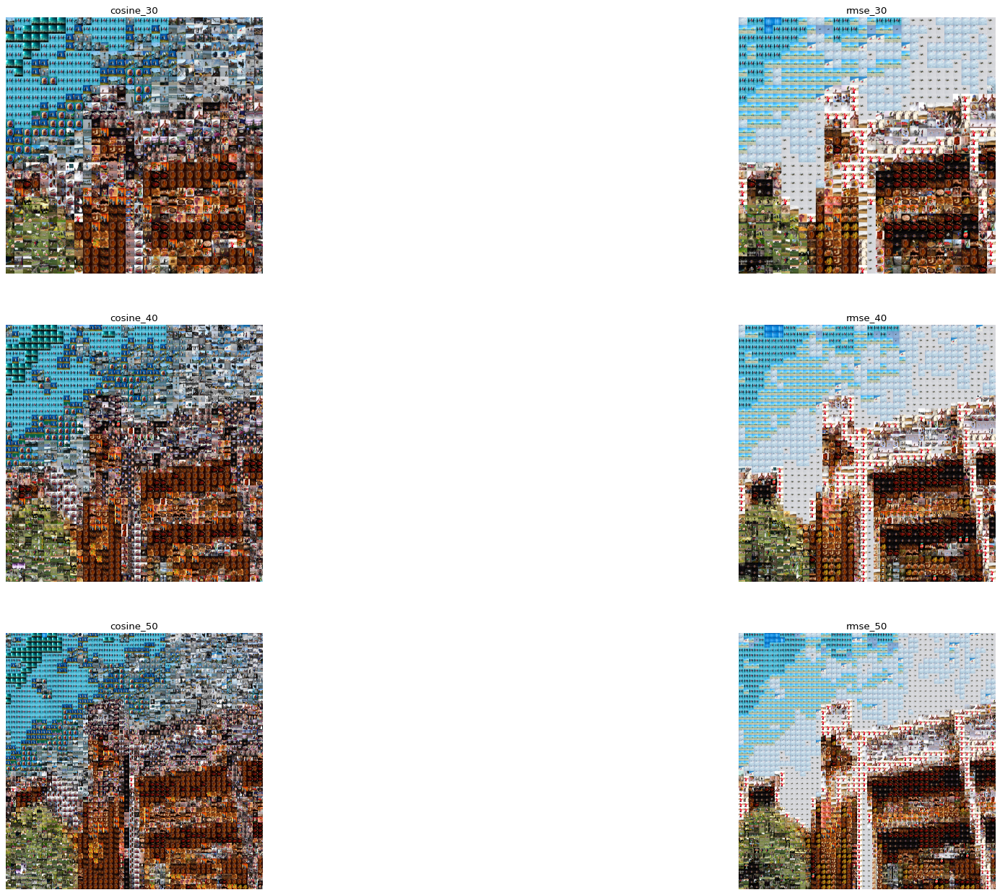

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(30,20), dpi=80)
plt.subplot(3,2,1)
plt.axis("off")
plt.imshow(ref1_30_cosine)
plt.title("cosine_30")
plt.subplot(3,2,2)
plt.axis("off")
plt.imshow(ref1_30_rmse)
plt.title("rmse_30")
plt.subplot(3,2,3)
plt.axis("off")
plt.imshow(ref1_40_cosine)
plt.title("cosine_40")
plt.subplot(3,2,4)
plt.axis("off")
plt.imshow(ref1_40_rmse)
plt.title("rmse_40")
plt.subplot(3,2,5)
plt.axis("off")
plt.imshow(ref1_50_cosine)
plt.title("cosine_50")
plt.subplot(3,2,6)
plt.axis("off")
plt.imshow(ref1_50_rmse)
plt.title("rmse_50")


Text(0.5, 1.0, 'rmse_50')

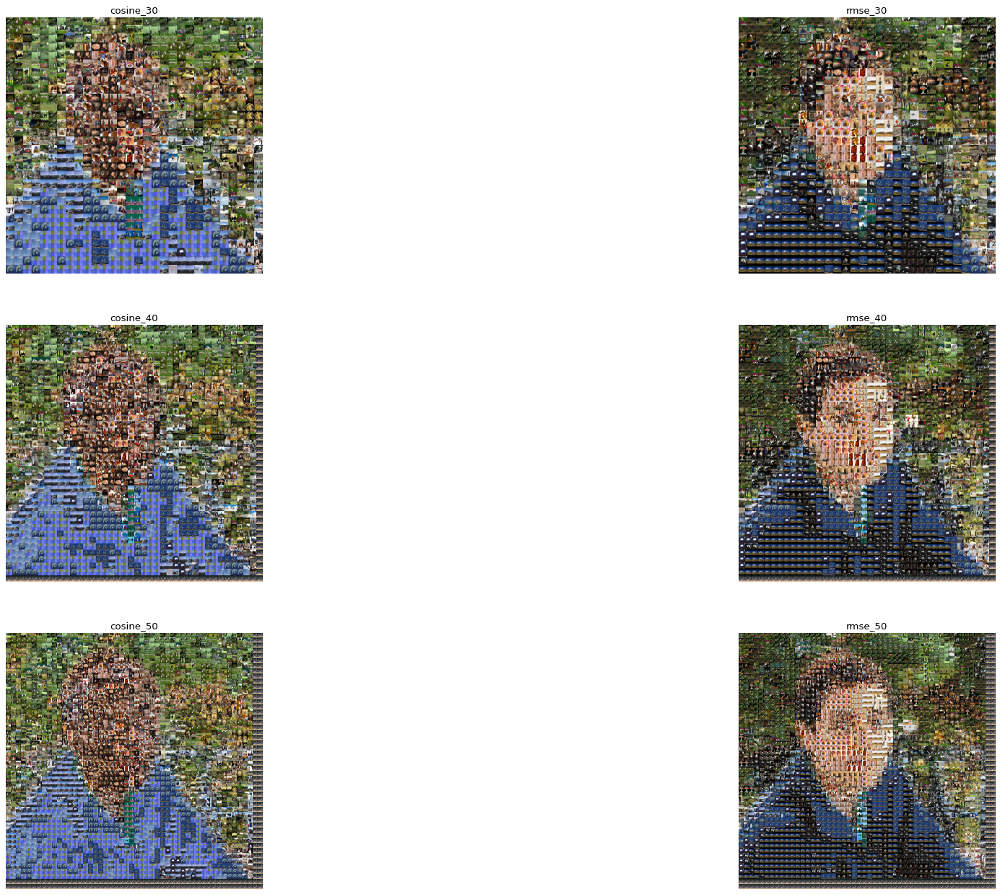

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(30,20), dpi=80)
plt.subplot(3,2,1)
plt.axis("off")
plt.imshow(ref2_30_cosine)
plt.title("cosine_30")
plt.subplot(3,2,2)
plt.axis("off")
plt.imshow(ref2_30_rmse)
plt.title("rmse_30")
plt.subplot(3,2,3)
plt.axis("off")
plt.imshow(ref2_40_cosine)
plt.title("cosine_40")
plt.subplot(3,2,4)
plt.axis("off")
plt.imshow(ref2_40_rmse)
plt.title("rmse_40")
plt.subplot(3,2,5)
plt.axis("off")
plt.imshow(ref2_50_cosine)
plt.title("cosine_50")
plt.subplot(3,2,6)
plt.axis("off")
plt.imshow(ref2_50_rmse)
plt.title("rmse_50")

Text(0.5, 1.0, 'rmse_50')

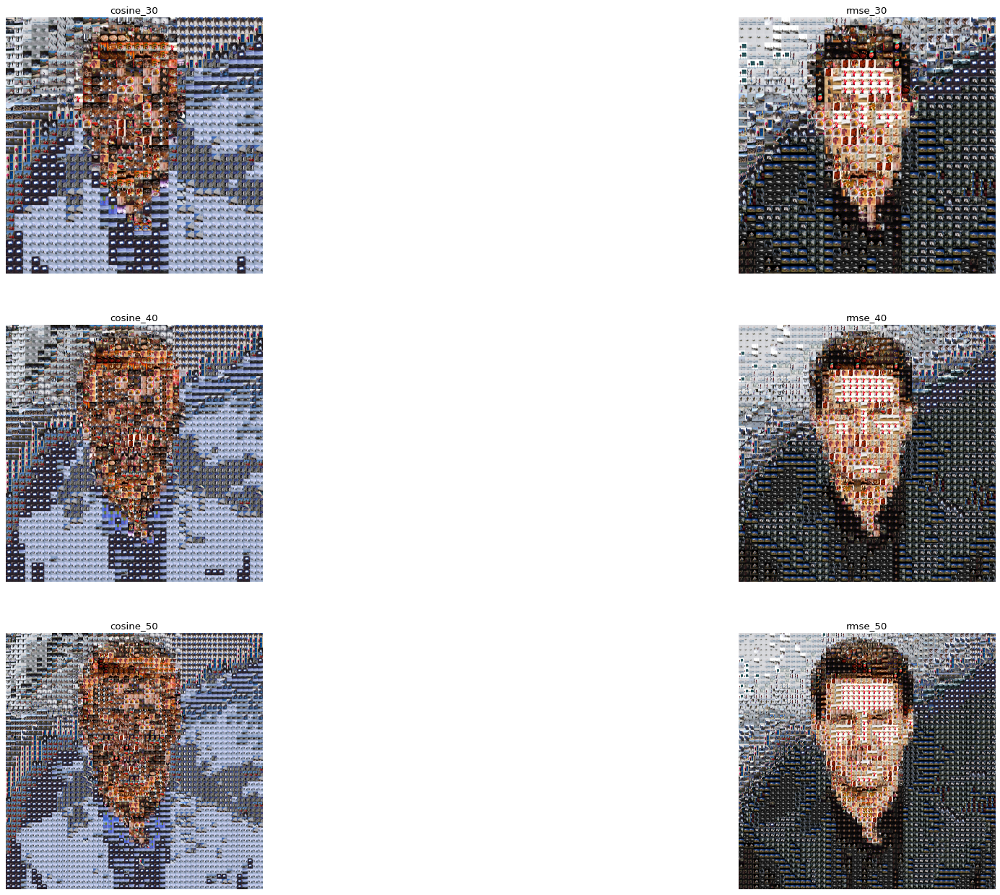

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(30,20), dpi=80)
plt.subplot(3,2,1)
plt.axis("off")
plt.imshow(ref3_30_cosine)
plt.title("cosine_30")
plt.subplot(3,2,2)
plt.axis("off")
plt.imshow(ref3_30_rmse)
plt.title("rmse_30")
plt.subplot(3,2,3)
plt.axis("off")
plt.imshow(ref3_40_cosine)
plt.title("cosine_40")
plt.subplot(3,2,4)
plt.axis("off")
plt.imshow(ref3_40_rmse)
plt.title("rmse_40")
plt.subplot(3,2,5)
plt.axis("off")
plt.imshow(ref3_50_cosine)
plt.title("cosine_50")
plt.subplot(3,2,6)
plt.axis("off")
plt.imshow(ref3_50_rmse)
plt.title("rmse_50")


Text(0.5, 1.0, 'rmse_50')

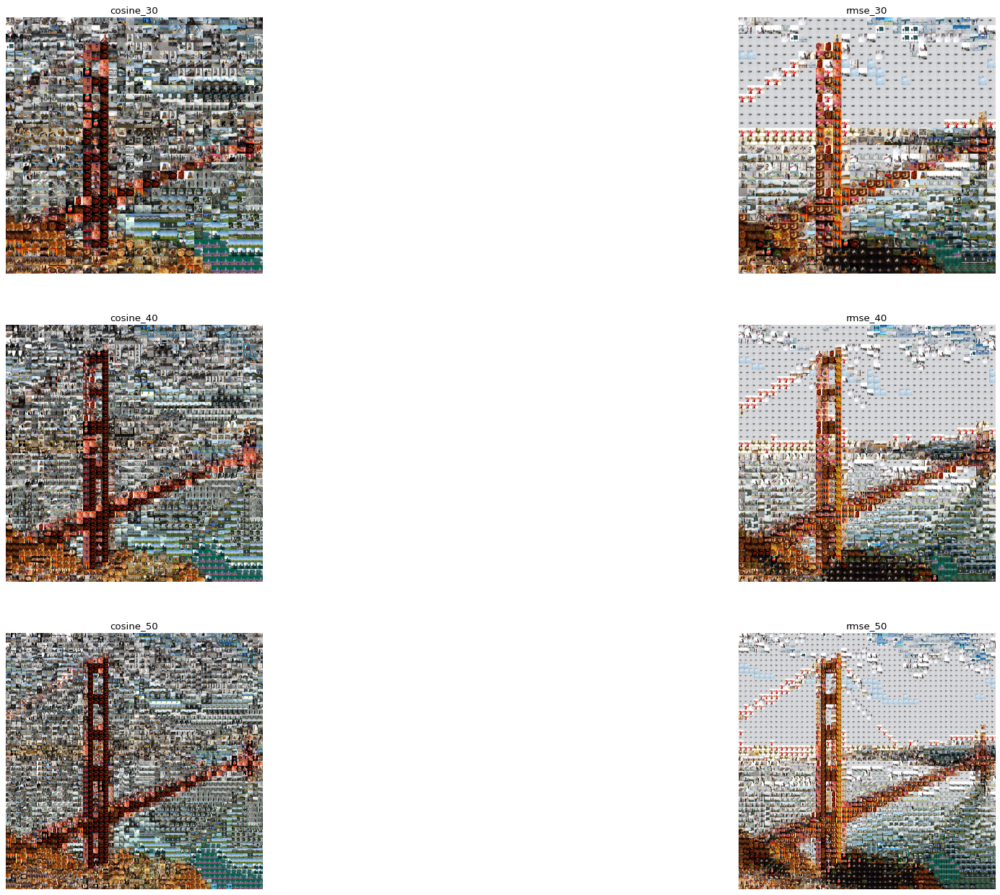

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(30,20), dpi=80)
plt.subplot(3,2,1)
plt.axis("off")
plt.imshow(ref4_30_cosine)
plt.title("cosine_30")
plt.subplot(3,2,2)
plt.axis("off")
plt.imshow(ref4_30_rmse)
plt.title("rmse_30")
plt.subplot(3,2,3)
plt.axis("off")
plt.imshow(ref4_40_cosine)
plt.title("cosine_40")
plt.subplot(3,2,4)
plt.axis("off")
plt.imshow(ref4_40_rmse)
plt.title("rmse_40")
plt.subplot(3,2,5)
plt.axis("off")
plt.imshow(ref4_50_cosine)
plt.title("cosine_50")
plt.subplot(3,2,6)
plt.axis("off")
plt.imshow(ref4_50_rmse)
plt.title("rmse_50")

we see that , rmse is better in resolution in all of 4 pictures . so RMSE criterion has better performance than cosine , and we see as number of pictures used to reconstruct gets bigger , and refrence picture takes down to smaller parts , the resolution gets better .

### Phase 2


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.neighbors import NearestNeighbors
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

silhouette factor for best n choosing.

In [ ]:
def  optimal_cluster_silhouette_method(matrix_data,max_clusters_check):
    foo = []
    for n_cluster in range(2,max_clusters_check):
        kmeans = KMeans(n_clusters=max_clusters_check).fit(matrix_data)
        label = kmeans.labels_
        sil_coeff = silhouette_score(matrix_data, label)
        print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))
        foo.append(sil_coeff)
    return foo 
ref_1_2D = ref_1.reshape((-1, 3))
y=optimal_cluster_silhouette_method(ref_1_2D,8)

In [ ]:
model = StandardScaler()
colorindx_1 = model.fit_transform(colorindx)
kmeans = KMeans(
    init="random",
    n_clusters=8,
    n_init=10,
    max_iter=300,
    random_state=42)
kmeans.fit(colorindx_1)

x0 = 50
x1 = 50
p0 = int(ref_4.shape[0] / x0)
p1 = int(ref_4.shape[1] / x1)
piecewise = []
for i in range(x0):
    for j in range(x1):
        piecewise.append(ref_4[p0*i:p0*(i+1), p1*j:p1*(j+1)])
colors_vector = []
for i in range(8):
    c = np.random.uniform(0,255,3)  
    color =[int(c[0]), int(c[1]), int(c[2])]
    colors_vector.append(color)

for i in  range(x0):
    for j in range(x1):
        op = model.transform(np.mean(piecewise[x1*i + j] , axis=0).mean(axis= 0).reshape(1,3))                     
        color_pic = int(kmeans.predict(op))
        if j == 0:
            f1 = cv2.resize(cv2.rectangle(Dataset[0], (0,0), (Dataset[0].shape[0] , Dataset[0].shape[1]), colors_vector[color_pic], -1) , (10,10))
            f2 = f1
        else : 
            f1 = cv2.resize(cv2.rectangle(Dataset[0], (0,0), (Dataset[0].shape[0] ,Dataset[0].shape[1]), colors_vector[color_pic], -1) , (10,10))
            f1 = np.concatenate((f2,f1) , axis = 1 )
            f2 = f1
    if i == 0:
        photo_1 = f1
        photo_2 = photo_1
    else : 
        photo_1 = f1
        photo_1 = np.concatenate((photo_2,photo_1), axis=0)
        photo_2 = photo_1

ref4_8 = photo_1
    

In [ ]:
model = StandardScaler()
colorindx_1 = model.fit_transform(colorindx)
kmeans = KMeans(
    init="random",
    n_clusters=12,
    n_init=10,
    max_iter=300,
    random_state=42)
kmeans.fit(colorindx_1)

x0 = 50
x1 = 50
p0 = int(ref_4.shape[0] / x0)
p1 = int(ref_4.shape[1] / x1)
piecewise = []
for i in range(x0):
    for j in range(x1):
        piecewise.append(ref_4[p0*i:p0*(i+1), p1*j:p1*(j+1)])
colors_vector = []
for i in range(12):
    c = np.random.uniform(0,255,3)  
    color =[int(c[0]), int(c[1]), int(c[2])]
    colors_vector.append(color)

for i in  range(x0):
    for j in range(x1):
        op = model.transform(np.mean(piecewise[x1*i + j] , axis=0).mean(axis= 0).reshape(1,3))                     
        color_pic = int(kmeans.predict(op))
        if j == 0:
            f1 = cv2.resize(cv2.rectangle(Dataset[0], (0,0), (Dataset[0].shape[0] , Dataset[0].shape[1]), colors_vector[color_pic], -1) , (10,10))
            f2 = f1
        else : 
            f1 = cv2.resize(cv2.rectangle(Dataset[0], (0,0), (Dataset[0].shape[0] ,Dataset[0].shape[1]), colors_vector[color_pic], -1) , (10,10))
            f1 = np.concatenate((f2,f1) , axis = 1 )
            f2 = f1
    if i == 0:
        photo_1 = f1
        photo_2 = photo_1
    else : 
        photo_1 = f1
        photo_1 = np.concatenate((photo_2,photo_1), axis=0)
        photo_2 = photo_1

ref4_12 = photo_1
    

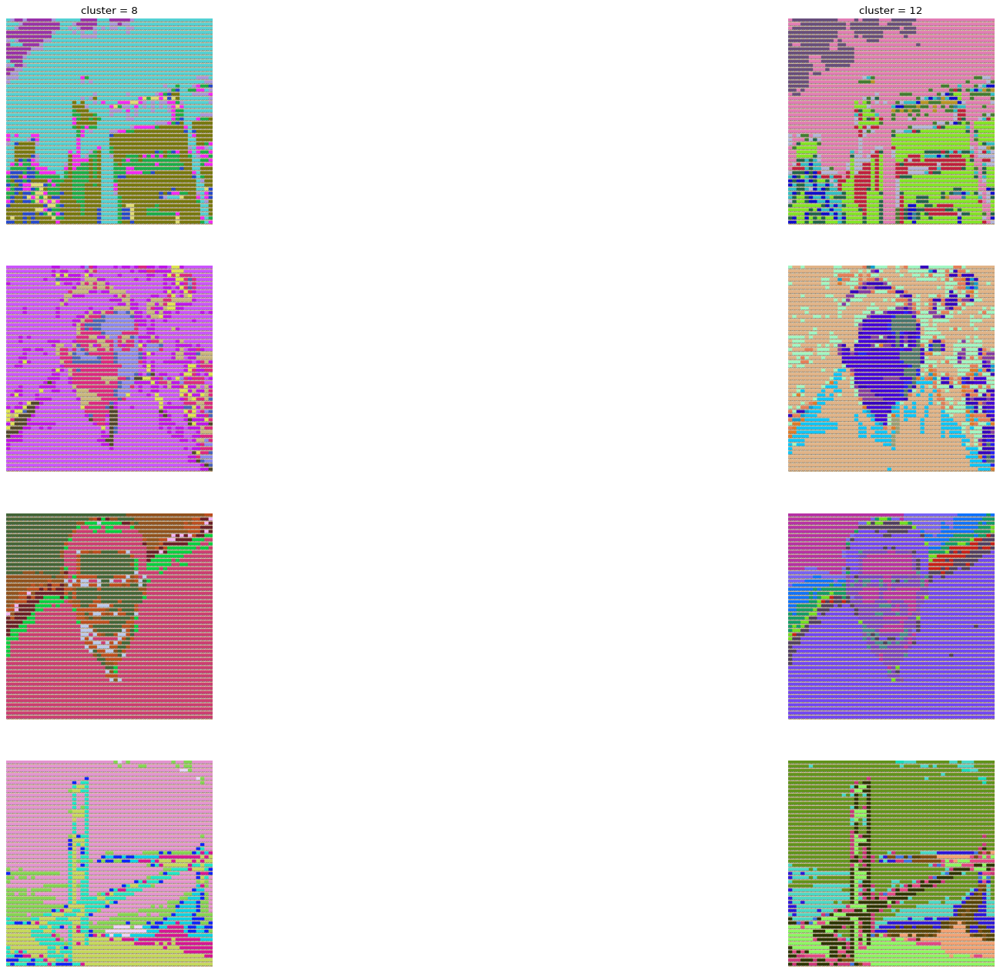

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(30,20), dpi=80)
plt.subplot(4,2,1)
plt.axis("off")
plt.imshow(ref1_8)
plt.title("cluster = 8")
plt.subplot(4,2,2)
plt.axis("off")
plt.imshow(ref1_12)
plt.title("cluster = 12")
plt.subplot(4,2,3)
plt.axis("off")
plt.imshow(ref2_8)
plt.subplot(4,2,4)
plt.axis("off")
plt.imshow(ref2_12)
plt.subplot(4,2,5)
plt.axis("off")
plt.imshow(ref3_8)
plt.subplot(4,2,6)
plt.axis("off")
plt.imshow(ref3_12)
plt.subplot(4,2,7)
plt.axis("off")
plt.imshow(ref4_8)
plt.subplot(4,2,8)
plt.axis("off")
plt.imshow(ref4_12)